<a href="https://colab.research.google.com/github/codeworks-data/mvp-dpe/blob/main/dpe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Scoping

## Description 

The following notebook details our approach to predict energy consumption for a given space in France (apartment, building, mall...).

  1. We will first start by exploring and understanding the data at hand to extract valuable insight.

  2. We will profile and clean the data.

  2. We will experiment with a few regression algorithms and evaluate their performance.

## Data Collection 

* This notebook only uses 5% of the national dataset for POC purposes.

https://data.ademe.fr/datasets/dpe-france

* The drive link to the sample dataset : 

https://drive.google.com/file/d/1WGcXruTT1ytPviui8JjNhW9Iekp-aKpD/view?usp=sharing

In [ ]:
# In order to get the execution time of each cell
!pip install ipython-autotime
%load_ext autotime

* We only ignore the warnings for format concerns. However, they were taken into consideration and only ignored after previous execution.

In [3]:
import warnings
warnings.filterwarnings('ignore')

time: 1.23 ms (started: 2021-02-26 10:57:04 +00:00)


In [ ]:
!pip install scikit-optimize
!pip install bayesian-optimization
!pip install catboost

# Import libraries

In [5]:
#For data manipulation
import numpy as np
import pandas as pd
from math import sqrt
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objs as go
import matplotlib.pyplot as plt 
import missingno as msno


#Scikit-Learn Functions
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score 
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor





#Models
import lightgbm as lgb
import catboost as cgb

# Optimization functions
from bayes_opt import BayesianOptimization
from skopt import gp_minimize
from skopt import BayesSearchCV
from skopt.utils import use_named_args
from skopt.plots import plot_convergence
from skopt.space import Real, Categorical, Integer
from skopt.callbacks import DeadlineStopper, VerboseCallback, DeltaXStopper



time: 2.68 s (started: 2021-02-26 10:57:24 +00:00)


# Data Exploration

### Import Data

* Let's mount data from Google Drive :

In [6]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive
time: 21.7 s (started: 2021-02-26 10:57:26 +00:00)


* Let's load the data into a pandas dataframe :

In [7]:
data = pd.read_csv('/content/drive/My Drive/datasets/dpe_5.csv', decimal= '.', low_memory = False)

time: 9.98 s (started: 2021-02-26 10:57:48 +00:00)


In [8]:
data.shape

(471571, 66)

time: 3.23 ms (started: 2021-02-26 10:57:58 +00:00)


In [9]:
data.columns

Index(['numero_dpe', 'usr_diagnostiqueur_id', 'usr_logiciel_id',
       'tr001_modele_dpe_id', 'nom_methode_dpe', 'version_methode_dpe',
       'nom_methode_etude_thermique', 'version_methode_etude_thermique',
       'date_visite_diagnostiqueur', 'date_etablissement_dpe',
       'date_arrete_tarifs_energies',
       'commentaires_ameliorations_recommandations',
       'explication_personnalisee', 'consommation_energie',
       'classe_consommation_energie', 'estimation_ges',
       'classe_estimation_ges', 'tr002_type_batiment_id', 'secteur_activite',
       'tr012_categorie_erp_id', 'tr013_type_erp_id', 'annee_construction',
       'surface_habitable', 'surface_thermique_lot', 'tv016_departement_id',
       'commune', 'arrondissement', 'type_voie', 'nom_rue', 'numero_rue',
       'batiment', 'escalier', 'etage', 'porte', 'code_postal',
       'code_insee_commune', 'code_insee_commune_actualise', 'numero_lot',
       'surface_commerciale_contractuelle', 'portee_dpe_batiment',
       'p

time: 8.81 ms (started: 2021-02-26 10:57:58 +00:00)


In [10]:
data.head(3)

,numero_dpe,usr_diagnostiqueur_id,usr_logiciel_id,tr001_modele_dpe_id,nom_methode_dpe,version_methode_dpe,nom_methode_etude_thermique,version_methode_etude_thermique,date_visite_diagnostiqueur,date_etablissement_dpe,date_arrete_tarifs_energies,commentaires_ameliorations_recommandations,explication_personnalisee,consommation_energie,classe_consommation_energie,estimation_ges,classe_estimation_ges,tr002_type_batiment_id,secteur_activite,tr012_categorie_erp_id,tr013_type_erp_id,annee_construction,surface_habitable,surface_thermique_lot,tv016_departement_id,commune,arrondissement,type_voie,nom_rue,numero_rue,batiment,escalier,etage,porte,code_postal,code_insee_commune,code_insee_commune_actualise,numero_lot,surface_commerciale_contractuelle,portee_dpe_batiment,partie_batiment,shon,surface_utile,surface_thermique_parties_communes,en_souterrain,en_surface,nombre_niveaux,nombre_circulations_verticales,nombre_boutiques,presence_verriere,surface_verriere,type_vitrage_verriere,nombre_entrees_avec_sas,nombre_entrees_sans_sas,surface_baies_orientees_nord,surface_baies_orientees_est_ouest,surface_baies_orientees_sud,surface_planchers_hauts_deperditifs,surface_planchers_bas_deperditifs,surface_parois_verticales_opaques_deperditives,etat_avancement,organisme_certificateur,adresse_organisme_certificateur,dpe_vierge,est_efface,date_reception_dpe
0,1857I1000025J,15559,6,22,3CL,2012,NaN,NaN,2018-06-25,2018-06-25,2018-08-15,NaN,NaN,200.66,D,6.24,B,2,NaN,NaN,NaN,1995,22.00,22.00,57,METZ,0,NaN,102 AVENUE DE STRASBOURG,38,Non communiqué,NaN,03,NaN,57070,57616,57616,Non communiqué,NaN,1.0,NaN,22.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,3.38,22.00,22.00,12.03,1,ITGA,test,0.0,0,2018-06-25 16:19:54
1,1491V1002160J,9498,13,1,3CL - DPE,V2012,NaN,NaN,2014-04-11,2014-04-11,2011-08-15,NaN,NaN,434.98,F,130.49,G,1,NaN,NaN,NaN,1969,72.00,72.00,91,SAINTRY,NaN,Rue,du Stade,24,NaN,NaN,NaN,NaN,91250,91577,91577,NaN,NaN,1.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,1,BUREAU_VERITAS Certification,"60 Avenue du Général de Gaulle , 92046 PARIS L...",0.0,0,2014-04-13 16:11:26
2,1738L1001445R,16598,3,9,Méthode 3CL,"3CL-DPE, version 1.3",NaN,NaN,2017-07-06,2017-07-17,2015-09-15,NaN,NaN,303.00,E,15.00,C,2,NaN,NaN,NaN,2001,47.97,47.97,38,ST ONDRAS,NaN,NaN,1829 route de la vallée,NaN,NaN,2eme étage porte droite,NaN,NaN,38490,38001,38001,Non communiqué,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.00,47.97,41.78,87.19,1,ABCIDIA CERTIFICATION,4 route de la Noue 91190 GIF SUR YVETTE,0.0,0,2017-07-17 15:24:28


time: 117 ms (started: 2021-02-26 10:57:58 +00:00)


* Let's get rid of unwanted columns based on the metadata file provided with the data. 
We get rid of the columns relating to the diagnosis (DPE), such as the ***'id'*** of the person in charge, the ***'id'*** of the method used, the name of the method used, the details of the adress which are mostly missing and the consumption of gas.

### Create New Dataframe

* We create a new dataframe ***df*** to host the remaining columns :

In [11]:
df = data.drop(['numero_dpe', 'nom_methode_dpe',
         'usr_diagnostiqueur_id','usr_logiciel_id','version_methode_dpe',
         'nom_methode_etude_thermique','commune',
         'tr012_categorie_erp_id','tr001_modele_dpe_id',
         'tr013_type_erp_id',
        'version_methode_etude_thermique','date_visite_diagnostiqueur', 'date_etablissement_dpe',
        'date_arrete_tarifs_energies', 'commentaires_ameliorations_recommandations',
        'explication_personnalisee', 'code_insee_commune_actualise', 
        'code_insee_commune','numero_lot', 'date_reception_dpe',
        'organisme_certificateur', 'adresse_organisme_certificateur',
        'est_efface', 'etat_avancement',  'dpe_vierge', 
        'arrondissement', 'numero_rue','type_voie',
         'escalier', 'porte', 'etage','batiment', 'nom_rue',
         'estimation_ges', 'classe_estimation_ges','code_postal' 
        ], axis = 1)

time: 56.2 ms (started: 2021-02-26 10:57:58 +00:00)


* For now we drop the ***'code_postal'*** column since we have a departement code column. But this column could proove useful as a feature in further modeling. Same goes for ***'nom_rue'***.

* Let's look at the shape of our data :

In [12]:
df.shape

(471571, 30)

time: 3.34 ms (started: 2021-02-26 10:57:58 +00:00)


* We have 30 columns left to explore.

* Let's list our columns and see how well did Pandas infer the data types of our columns :

In [13]:
df.dtypes

consommation_energie                              float64
classe_consommation_energie                        object
tr002_type_batiment_id                              int64
secteur_activite                                   object
annee_construction                                  int64
surface_habitable                                 float64
surface_thermique_lot                             float64
tv016_departement_id                                int64
surface_commerciale_contractuelle                  object
portee_dpe_batiment                               float64
partie_batiment                                    object
shon                                              float64
surface_utile                                     float64
surface_thermique_parties_communes                float64
en_souterrain                                     float64
en_surface                                        float64
nombre_niveaux                                    float64
nombre_circula

time: 9.61 ms (started: 2021-02-26 10:57:58 +00:00)


### Data Cleaning

#### Missing Values

* Let's have a look at the percentage of missing values in each column to decide whether more colums should be dropped.

In [14]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_values = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
missing_values

,column_name,percent_missing
consommation_energie,consommation_energie,0.000000
classe_consommation_energie,classe_consommation_energie,0.000000
tr002_type_batiment_id,tr002_type_batiment_id,0.000000
secteur_activite,secteur_activite,79.867295
annee_construction,annee_construction,0.000000
surface_habitable,surface_habitable,0.194244
surface_thermique_lot,surface_thermique_lot,0.194244
tv016_departement_id,tv016_departement_id,0.000000
surface_commerciale_contractuelle,surface_commerciale_contractuelle,88.711350
portee_dpe_batiment,portee_dpe_batiment,19.347034


time: 160 ms (started: 2021-02-26 10:57:58 +00:00)


* Let's get rid of columns where most values are missing (80% or more) and which cannot be deduced from other columns :

In [15]:
df.drop([
      'type_vitrage_verriere','partie_batiment',
      'surface_commerciale_contractuelle', 'secteur_activite',
      ], axis = 1 , inplace = True)

time: 40 ms (started: 2021-02-26 10:57:58 +00:00)


In [ ]:
df.shape

(471571, 26)

time: 5.45 ms (started: 2021-02-23 12:50:03 +00:00)


* We have 26 columns remaining.

* Let's create a new dataframe **null_df**  with the columns containing any missing values, to try and understand them :

In [ ]:
null_df = df[[col for col in df.columns if df[col].isnull().any()]]

time: 67.6 ms (started: 2021-02-23 12:50:04 +00:00)


In [ ]:
null_df.shape

(471571, 21)

time: 2.71 ms (started: 2021-02-23 12:50:04 +00:00)


* 23 columns have missing values.

* Let's analyze the correlation between the missing values : 

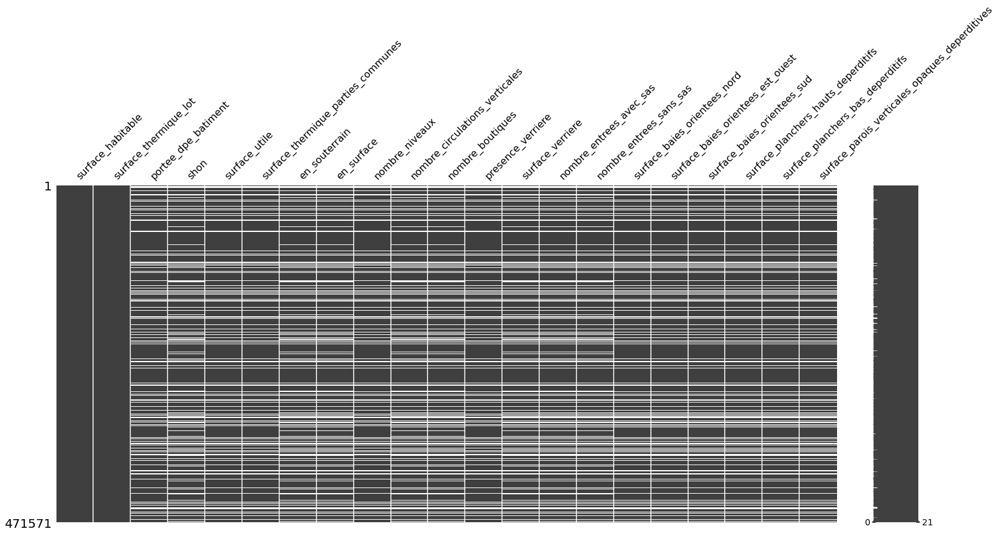

time: 3.09 s (started: 2021-02-23 12:50:05 +00:00)


In [ ]:
msno.matrix(null_df)

* This matrix shows the correlated records within the columns. We can already see that many columns have similar patterns when it comes to missing data.

* Let's analyze it further with a heatmap :

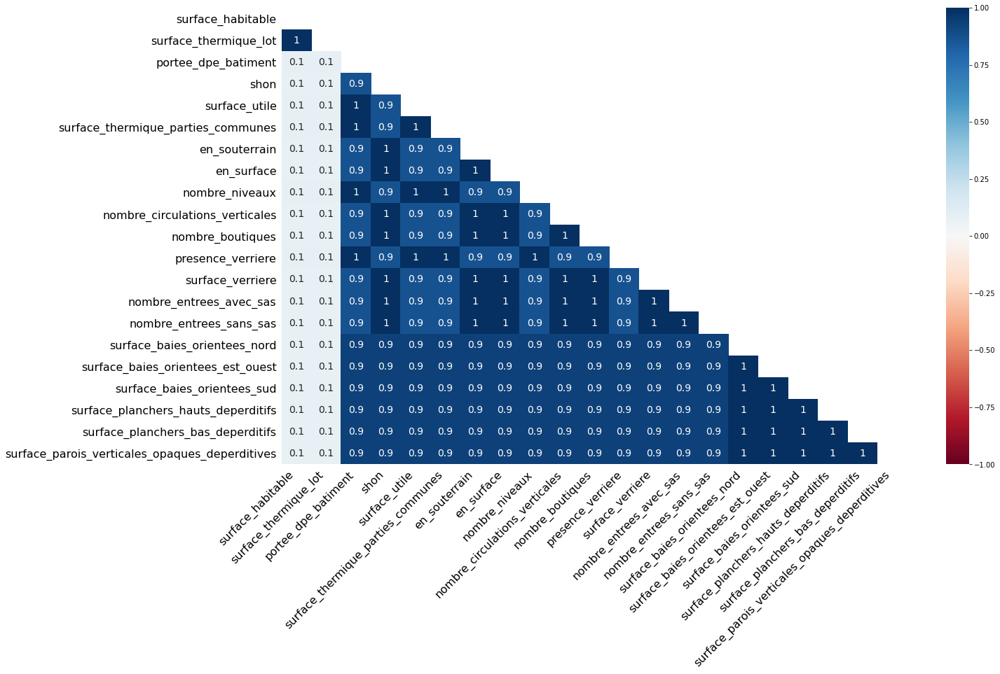

time: 2.33 s (started: 2021-02-23 12:50:08 +00:00)


In [ ]:
msno.heatmap(null_df)

* The map shows high correlation between groups of columns.
To visualize these groups, we'll use a dendrogram :

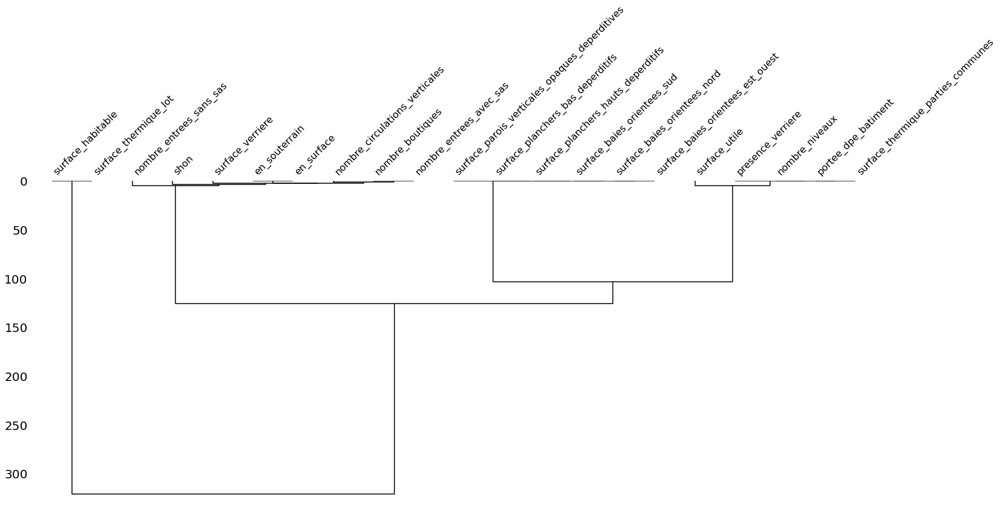

time: 807 ms (started: 2021-02-23 12:50:11 +00:00)


In [ ]:
msno.dendrogram(null_df)

* The missing values are clearly correlated in groups (mainly 4).

* We can safely get rid of the missing values without loosing too many rows. 

In [ ]:
df.dropna(inplace=True)

time: 129 ms (started: 2021-02-23 12:50:11 +00:00)


In [ ]:
df.shape

(358249, 26)

time: 3.87 ms (started: 2021-02-23 12:50:12 +00:00)


* That leaves us with **360k** rows.

In [ ]:
df.dtypes

consommation_energie                              float64
classe_consommation_energie                        object
tr002_type_batiment_id                              int64
annee_construction                                  int64
surface_habitable                                 float64
surface_thermique_lot                             float64
tv016_departement_id                                int64
portee_dpe_batiment                               float64
shon                                              float64
surface_utile                                     float64
surface_thermique_parties_communes                float64
en_souterrain                                     float64
en_surface                                        float64
nombre_niveaux                                    float64
nombre_circulations_verticales                    float64
nombre_boutiques                                  float64
presence_verriere                                 float64
surface_verrie

time: 8.6 ms (started: 2021-02-23 12:50:12 +00:00)


#### Correlation

* Let's take a look at the correlation between the numerical columns :

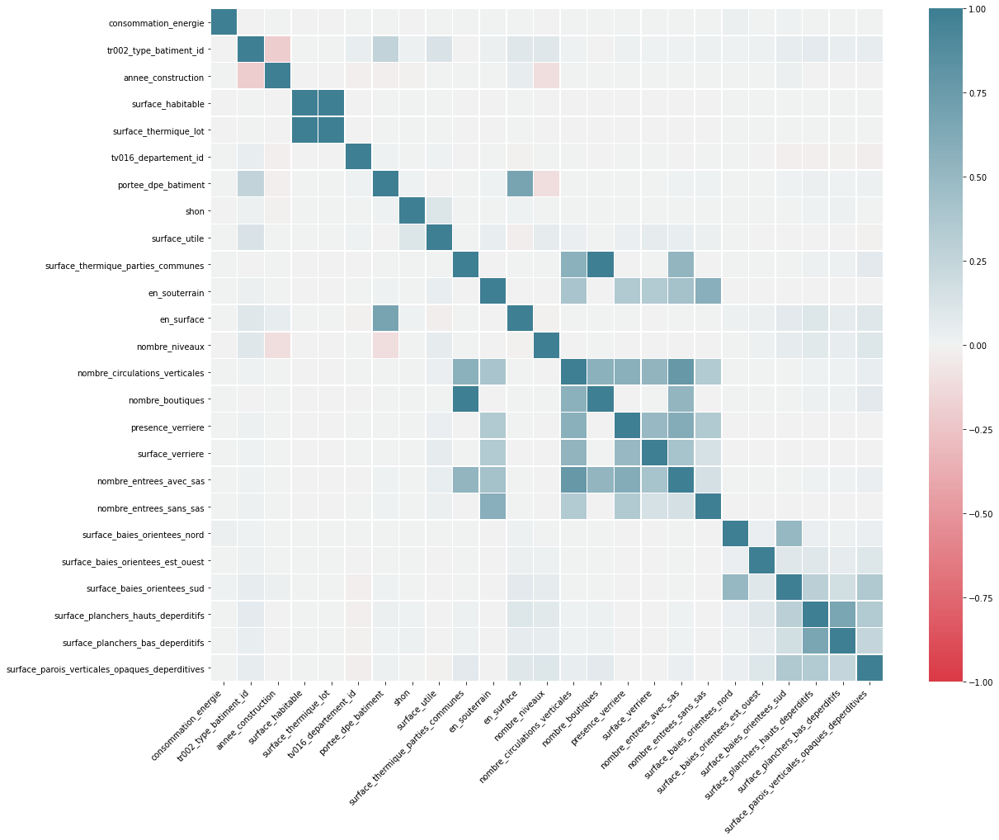

time: 1.59 s (started: 2021-02-23 12:50:12 +00:00)


In [ ]:
corr = df.corr()

plt.subplots(figsize=(20,15))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(10, 220, n=2000),
    square=True, linewidths=.5
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

* **surface_thermique_parties_communes** and **nombre_boutiques** are perfectly correlated. So we'll drop the latter.

* **surface_thermique_lot** and **surface_habitable** are also perfectly correlated. We'll drop the former.

In [ ]:
df.drop(['nombre_boutiques','surface_thermique_lot'], axis = 1, inplace = True)

time: 42.6 ms (started: 2021-02-23 12:50:13 +00:00)


#### Data Inspection

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 358249 entries, 0 to 471570
Data columns (total 24 columns):
 #   Column                                          Non-Null Count   Dtype  
---  ------                                          --------------   -----  
 0   consommation_energie                            358249 non-null  float64
 1   classe_consommation_energie                     358249 non-null  object 
 2   tr002_type_batiment_id                          358249 non-null  int64  
 3   annee_construction                              358249 non-null  int64  
 4   surface_habitable                               358249 non-null  float64
 5   tv016_departement_id                            358249 non-null  int64  
 6   portee_dpe_batiment                             358249 non-null  float64
 7   shon                                            358249 non-null  float64
 8   surface_utile                                   358249 non-null  float64
 9   surface_thermique_parties_

* Let's look at the remaining data description :

In [ ]:
df.describe(percentiles= [.05,.10,.20, .30, .40, .50, .60, .70, .80, .90])

,consommation_energie,tr002_type_batiment_id,annee_construction,surface_habitable,tv016_departement_id,portee_dpe_batiment,shon,surface_utile,surface_thermique_parties_communes,en_souterrain,en_surface,nombre_niveaux,nombre_circulations_verticales,presence_verriere,surface_verriere,nombre_entrees_avec_sas,nombre_entrees_sans_sas,surface_baies_orientees_nord,surface_baies_orientees_est_ouest,surface_baies_orientees_sud,surface_planchers_hauts_deperditifs,surface_planchers_bas_deperditifs,surface_parois_verticales_opaques_deperditives
count,3.582490e+05,358249.000000,358249.000000,3.582490e+05,358249.000000,358249.000000,3.582490e+05,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000,358249.000000
mean,1.955017e+02,1.739692,1865.396721,2.716964e+02,52.021912,0.268618,3.492632e+01,26.297921,0.000558,0.000033,0.109845,1.076371,0.000031,0.000017,0.002522,0.000042,0.000022,4.737074,7.195082,4.557571,48.505327,44.614849,60.450276
std,5.337883e+03,0.795053,537.093611,7.068531e+04,26.590156,0.607010,4.022904e+03,292.258868,0.236277,0.005788,0.312697,1.554607,0.008354,0.004092,1.237822,0.008997,0.005788,260.060530,179.207016,41.174829,311.310030,352.816915,390.355413
min,-3.804140e+03,1.000000,0.000000,0.000000e+00,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-147.270000,0.000000,-1.000000,-29.000000,-441.340000
5%,0.000000e+00,1.000000,1.000000,2.300000e+01,6.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10%,0.000000e+00,1.000000,1929.000000,3.200000e+01,13.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
20%,3.854000e+01,1.000000,1947.000000,4.545000e+01,27.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
30%,9.700000e+01,1.000000,1947.000000,5.684000e+01,34.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
40%,1.410000e+02,1.000000,1948.000000,6.600000e+01,44.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.730000e+02,2.000000,1964.000000,7.500000e+01,56.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


time: 415 ms (started: 2021-02-23 12:50:13 +00:00)


* We can already see from the description that some columns have negative values and illogical values.

* Let's check the columns for any irregularities :

##### ***'annee_construction'*** 
* Let's start with ***'annee_construction'*** : 




In [ ]:


fig = px.box(df, y="annee_construction")
fig.show(renderer="colab")

time: 2.45 s (started: 2021-02-23 12:50:15 +00:00)



* The boxplot shows many outliers. 

- Let's look at the distribution :

In [ ]:
fig = px.histogram(df, x="annee_construction", range_x=(1500,2020))
fig.show(renderer="colab")

time: 1.93 s (started: 2021-02-23 12:50:18 +00:00)


* There are many unreasonable values. Let's look at the years before 1500 and after 2020 :

In [ ]:
df[(df['annee_construction'] > 2020) | (df['annee_construction'] < 1500) ].shape

(19389, 24)

time: 18.9 ms (started: 2021-02-23 12:50:20 +00:00)


* There are about **20k** values to modify.

In [ ]:
df[( df['annee_construction'] < 2020) & (df['annee_construction'] > 1500)]['annee_construction'].mean()

1967.7331907577968

time: 39 ms (started: 2021-02-23 12:50:23 +00:00)


In [ ]:
df[( df['annee_construction'] < 2020) & (df['annee_construction'] > 1500)]['annee_construction'].median()

1969.0

time: 42.8 ms (started: 2021-02-23 12:50:23 +00:00)


* Let's replace those values with the median of the column :

In [ ]:
df.loc[((df.annee_construction < 1500) | (df.annee_construction > 2020 )),'annee_construction'] = df.loc[((df.annee_construction > 1500)
 & (df.annee_construction < 2020 )),'annee_construction'].median()

time: 24.7 ms (started: 2021-02-23 12:50:24 +00:00)


##### ***'surface_habitable'***
* Next, let's look at ***'surface_habitable'*** :

In [ ]:
df['surface_habitable'].describe()

count    3.582490e+05
mean     2.716964e+02
std      7.068531e+04
min      0.000000e+00
25%      5.096000e+01
50%      7.500000e+01
75%      1.060000e+02
max      4.230518e+07
Name: surface_habitable, dtype: float64

time: 26.1 ms (started: 2021-02-23 12:50:25 +00:00)


In [ ]:

fig = px.box(df, y="surface_habitable")
fig.show(renderer="colab")

time: 1.86 s (started: 2021-02-23 12:50:26 +00:00)


* The boxplot shows some outliers, and looking at the column description it seems that values above 1000 for the surface seem unreasonable. 

This is strictly based on opinion as there is no real expertise based evidence that supports this.

In [ ]:
df.loc[df.surface_habitable > 1000].shape

(6924, 24)

time: 10.5 ms (started: 2021-02-23 12:50:28 +00:00)


* Let's drop the surfaces that exceed 1000 :

In [ ]:
df.drop(df.loc[df['surface_habitable'] > 1000 ].index, inplace = True)

time: 55 ms (started: 2021-02-23 12:50:30 +00:00)


##### ***'nombre_niveaux'***
* Let's have a look at ***'nombre_niveaux'*** :

In [ ]:
fig = px.histogram(df, x="nombre_niveaux")
fig.show(renderer="colab")

time: 1.52 s (started: 2021-02-23 12:50:31 +00:00)


In [ ]:
df.nombre_niveaux.value_counts()

1.0      171194
0.0      108678
2.0       50868
3.0       10423
4.0        3717
5.0        2475
6.0        1240
7.0         811
8.0         702
9.0         294
10.0        204
11.0        199
16.0        103
12.0         94
13.0         85
14.0         34
17.0         29
15.0         23
42.0         22
28.0         17
29.0         16
21.0         15
60.0         14
19.0         10
20.0          9
39.0          9
22.0          7
18.0          6
74.0          4
25.0          4
27.0          4
63.0          3
76.0          3
43.0          2
136.0         1
34.0          1
246.0         1
33.0          1
32.0          1
40.0          1
30.0          1
Name: nombre_niveaux, dtype: int64

time: 15.5 ms (started: 2021-02-23 12:50:32 +00:00)


* The values make absolutely no sense, the highest building in France has only 56 floors.
After taking a look at the adresses on google maps it appears that neither the adresses nor the number of floors are reliable features.

In [ ]:
df.loc[df.nombre_niveaux > 25,'nombre_niveaux'].value_counts().sum()

101

time: 6.84 ms (started: 2021-02-23 12:50:32 +00:00)


In [ ]:
df.loc[df.nombre_niveaux > 25, 'classe_consommation_energie'].value_counts()

N    79
C    14
D     2
A     2
E     2
G     1
B     1
Name: classe_consommation_energie, dtype: int64

time: 13.4 ms (started: 2021-02-23 12:50:32 +00:00)


 * Most rows with a high ***'nombre_niveaux'*** have N as ***'classe_consommation_energie'***.

* We made the choice to cut all rows with ***'nombre_niveaux'*** higher than **25**. Since we cannot make sense of the outliers, and since they only represent 101 rows. 


* Sidenote :  We have looked the the ***'batiment'***,  ***'etage'*** and ***'nom_rue'*** columns (which we dropped in the beginning) to try and make sense of the number of floors. Unfortunately, we couldn't come up with anything useful.

* The choice of 25 is based on intuition.

In [ ]:
df.drop(df.loc[df['nombre_niveaux'] > 25].index, inplace=True)

time: 53.1 ms (started: 2021-02-23 12:50:34 +00:00)


##### ***'en_surface'*** , ***'en_souterrain'*** & ***'presence_verriere'*** 

***'en_surface'*** , ***'en_souterrain'*** and ***'presence_verriere'*** are boolean columns.

In [ ]:
df['en_surface'].value_counts()

0.0    315729
1.0     35495
Name: en_surface, dtype: int64

time: 15.3 ms (started: 2021-02-23 12:50:35 +00:00)


In [ ]:
df['en_souterrain'].value_counts()

0.0    351212
1.0        12
Name: en_souterrain, dtype: int64

time: 11.5 ms (started: 2021-02-23 12:50:35 +00:00)


In [ ]:
df['presence_verriere'].value_counts()

0.0    351218
1.0         6
Name: presence_verriere, dtype: int64

time: 14.4 ms (started: 2021-02-23 12:50:36 +00:00)


##### ***'tv016_departement_id'***

In [ ]:
df['tv016_departement_id'].unique()

array([57, 91, 38, 75, 27, 29, 47, 13, 16, 71,  9,  7, 85, 35,  1, 49, 14,
       89, 59, 37, 94, 56, 69, 62, 93, 84, 30,  6, 42, 64, 81, 76, 33, 54,
       39, 22, 88, 68, 34, 60, 63, 31, 36, 78, 28, 77, 32, 87, 66, 44, 40,
       73, 92, 80, 67, 83, 12, 21, 74, 61,  3, 82, 86, 70,  8, 79, 15, 53,
       65, 25, 95, 18,  2, 51, 11, 17, 41, 50, 90, 10, 45, 46, 72, 43, 23,
       48, 96, 24,  4, 19, 52, 26, 97, 58, 55,  5])

time: 7.14 ms (started: 2021-02-23 12:50:37 +00:00)


* Let's replace ***96*** departement with ***20*** :

In [ ]:
df.loc[df['tv016_departement_id'] == 96 , 'tv016_departement_id'] = 20

time: 6.59 ms (started: 2021-02-23 12:50:38 +00:00)


##### ***'surface_parois_verticales_opaques_deperditives'*** 

In [ ]:
df['surface_parois_verticales_opaques_deperditives'].describe()

count    351224.000000
mean         55.623069
std         374.279557
min        -441.340000
25%           0.000000
50%           0.000000
75%          63.710000
max      168168.000000
Name: surface_parois_verticales_opaques_deperditives, dtype: float64

time: 20.9 ms (started: 2021-02-23 12:50:39 +00:00)


In [ ]:
df.loc[df.surface_parois_verticales_opaques_deperditives < 0, 'surface_parois_verticales_opaques_deperditives' ]

33843      -1.37
67346      -1.50
76116      -1.50
79363      -1.50
111898    -90.86
177587     -1.51
203168    -60.00
227190     -2.00
313802     -0.19
317711     -0.67
321525     -2.53
331978     -1.00
333866     -1.50
385145     -0.20
404728   -441.34
431919     -5.55
Name: surface_parois_verticales_opaques_deperditives, dtype: float64

time: 7.78 ms (started: 2021-02-23 12:50:40 +00:00)


* Since there are but few negative values, we consider them as a human typing error, and we correct them by multiplying them by -1 :

In [ ]:
df.loc[df.surface_parois_verticales_opaques_deperditives < 0, 'surface_parois_verticales_opaques_deperditives' ] = df.surface_parois_verticales_opaques_deperditives * -1

time: 20.9 ms (started: 2021-02-23 12:50:41 +00:00)


##### ***'surface_planchers_bas_deperditifs'***

In [ ]:
df['surface_planchers_bas_deperditifs'].describe()

count    351224.000000
mean         42.088757
std         201.347983
min         -29.000000
25%           0.000000
50%           0.000000
75%          51.350000
max       29321.000000
Name: surface_planchers_bas_deperditifs, dtype: float64

time: 24 ms (started: 2021-02-23 12:50:41 +00:00)


In [ ]:
df.loc[df['surface_planchers_bas_deperditifs'] < 0 , 'surface_planchers_bas_deperditifs']

380010   -29.0
Name: surface_planchers_bas_deperditifs, dtype: float64

time: 10.3 ms (started: 2021-02-23 12:50:42 +00:00)


* Same as before we consider this value a human error, and we take its posiitve counter part :

In [ ]:
df.loc[df.surface_planchers_bas_deperditifs < 0, 'surface_planchers_bas_deperditifs' ] = df.surface_planchers_bas_deperditifs  * -1

time: 9.17 ms (started: 2021-02-23 12:50:43 +00:00)


##### ***'surface_baies_orientees_est_ouest'***

In [ ]:
df['surface_baies_orientees_est_ouest'].describe()

count    351224.000000
mean          6.809274
std         180.374348
min        -147.270000
25%           0.000000
50%           0.000000
75%           0.330000
max      102537.000000
Name: surface_baies_orientees_est_ouest, dtype: float64

time: 24.4 ms (started: 2021-02-23 12:50:44 +00:00)


In [ ]:
df.loc[df['surface_baies_orientees_est_ouest'] < 0, 'surface_baies_orientees_est_ouest']

148531   -147.27
Name: surface_baies_orientees_est_ouest, dtype: float64

time: 12.8 ms (started: 2021-02-23 12:50:44 +00:00)


Idem :

In [ ]:
df.loc[df.surface_baies_orientees_est_ouest  < 0, 'surface_baies_orientees_est_ouest' ] = df.surface_baies_orientees_est_ouest  * -1

time: 11.2 ms (started: 2021-02-23 12:50:45 +00:00)


##### ***Target***

* The target is expressed in two columns, the ***consommation_energie*** and the corresponding ***classe_consommation_energie***.


In [ ]:
df['consommation_energie'].describe()

count    3.512240e+05
mean     1.962915e+02
std      5.390938e+03
min     -3.804140e+03
25%      6.479000e+01
50%      1.740000e+02
75%      2.543300e+02
max      3.110395e+06
Name: consommation_energie, dtype: float64

time: 25.7 ms (started: 2021-02-23 12:50:46 +00:00)


* The target does not seem to have visible missing values. However, we need to investigate the '0' and negative values :

In [ ]:
df.loc[df['consommation_energie'] < 0, 'consommation_energie'].describe()

count      68.000000
mean     -264.059706
std       812.419080
min     -3804.140000
25%       -62.217500
50%       -31.490000
75%       -13.380000
max        -0.360000
Name: consommation_energie, dtype: float64

time: 15.3 ms (started: 2021-02-23 12:50:47 +00:00)


* For the negative values, and after consulting google maps, the adresses are not for energy establishemlents, so either there was a mistake when entering the data and the '-' sign was accidental or the buildings have solar power (or some other form of power) integrated! 

* We will consider that the negative values were an oversight. So we will convert them to their positive counter points :

In [ ]:
df.loc[df.consommation_energie < 0, 'consommation_energie' ] = df.consommation_energie * -1

time: 14.2 ms (started: 2021-02-23 12:50:48 +00:00)


* Let's have a look at the energy consumption based on the consumption class :

In [ ]:
fig = px.histogram(df, x="consommation_energie", color = "classe_consommation_energie",  range_x=(0,1000))
fig.show(renderer = 'colab')

time: 1.98 s (started: 2021-02-23 12:50:49 +00:00)


* There are some unknown classes, let's investigate : 

In [ ]:
df['classe_consommation_energie'].value_counts()

D    93888
N    70576
E    67597
C    47660
F    25980
B    19927
A    15392
G    10153
S       44
-        4
I        3
Name: classe_consommation_energie, dtype: int64

time: 63.2 ms (started: 2021-02-23 12:50:51 +00:00)


* Let's look at the **'I'** and **'-'** classes :

In [ ]:
df.loc[df['classe_consommation_energie']=='I','consommation_energie'].value_counts()

5297.20    2
5433.04    1
Name: consommation_energie, dtype: int64

time: 48.2 ms (started: 2021-02-23 12:50:51 +00:00)


In [ ]:
df.loc[df['classe_consommation_energie']=='-','consommation_energie'].value_counts()

0.0    4
Name: consommation_energie, dtype: int64

time: 57 ms (started: 2021-02-23 12:50:52 +00:00)


* Since the 'I' and '-' classes make no sense and we can't deduce them from the 'consommation_energie' column, let's drop them :

In [ ]:
df.drop(df.loc[(df.classe_consommation_energie == 'I') | (df.classe_consommation_energie == '-')].index, inplace = True)

time: 82 ms (started: 2021-02-23 12:50:52 +00:00)


* Let's have a look at the **'S'** class :

In [ ]:
df.loc[df['classe_consommation_energie']=='S','consommation_energie'].value_counts()

30.24     2
39.28     2
41.60     2
83.71     1
102.81    1
38.22     1
34.02     1
74.60     1
26.62     1
78.89     1
38.67     1
28.98     1
87.24     1
39.06     1
45.79     1
30.84     1
38.02     1
86.98     1
29.38     1
93.28     1
36.31     1
29.34     1
30.06     1
81.93     1
27.26     1
86.45     1
84.91     1
104.23    1
83.79     1
30.45     1
28.45     1
88.86     1
95.08     1
79.33     1
28.94     1
108.57    1
27.07     1
46.02     1
39.99     1
29.68     1
83.75     1
Name: consommation_energie, dtype: int64

time: 32 ms (started: 2021-02-23 12:50:54 +00:00)


* Since the **'S'** class has valid values for 'consommation_energie', we will use those values to correct the 'class_consommation_energie'.

* We base those intervals on the standard **étiquette énergie** intervals.

In [ ]:
df.loc[(df.classe_consommation_energie == 'S') & (df.consommation_energie > 0) & (df.consommation_energie <= 50),'classe_consommation_energie']='A'
df.loc[(df.classe_consommation_energie == 'S') & (df.consommation_energie > 50) & (df.consommation_energie <= 90),'classe_consommation_energie']='B'
df.loc[(df.classe_consommation_energie == 'S') & (df.consommation_energie > 90) & (df.consommation_energie <= 150),'classe_consommation_energie']='C'
df.loc[(df.classe_consommation_energie == 'S') & (df.consommation_energie > 150) & (df.consommation_energie <= 230),'classe_consommation_energie']='D'
df.loc[(df.classe_consommation_energie == 'S') & (df.consommation_energie > 230) & (df.consommation_energie <= 330),'classe_consommation_energie']='E'
df.loc[(df.classe_consommation_energie == 'S') & (df.consommation_energie > 330) & (df.consommation_energie < 450),'classe_consommation_energie']='F'
df.loc[(df.classe_consommation_energie == 'S') & (df.consommation_energie >= 450),'classe_consommation_energie']='G'


time: 217 ms (started: 2021-02-23 12:50:54 +00:00)


* Let's have a look at the **'N'** class :

In [ ]:
df.loc[df.classe_consommation_energie == 'N', 'consommation_energie'].describe()

count    70576.000000
mean        16.179057
std        149.350406
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      37051.250000
Name: consommation_energie, dtype: float64

time: 51.1 ms (started: 2021-02-23 12:50:56 +00:00)


* We use the same logic as the previous class to correct the class, using **l'étiquette énergie** :

In [ ]:
df.loc[(df.classe_consommation_energie == 'N') & (df.consommation_energie > 0) & (df.consommation_energie <= 50),'classe_consommation_energie']='A'
df.loc[(df.classe_consommation_energie == 'N') & (df.consommation_energie > 50) & (df.consommation_energie <= 90),'classe_consommation_energie']='B'
df.loc[(df.classe_consommation_energie == 'N') & (df.consommation_energie > 90) & (df.consommation_energie <= 150),'classe_consommation_energie']='C'
df.loc[(df.classe_consommation_energie == 'N') & (df.consommation_energie > 150) & (df.consommation_energie <= 230),'classe_consommation_energie']='D'
df.loc[(df.classe_consommation_energie == 'N') & (df.consommation_energie > 230) & (df.consommation_energie <= 330),'classe_consommation_energie']='E'
df.loc[(df.classe_consommation_energie == 'N') & (df.consommation_energie > 330) & (df.consommation_energie < 450),'classe_consommation_energie']='F'
df.loc[(df.classe_consommation_energie == 'N') & (df.consommation_energie >= 450),'classe_consommation_energie']='G'

time: 214 ms (started: 2021-02-23 12:50:56 +00:00)


In [ ]:
df.loc[df.classe_consommation_energie == 'N', 'consommation_energie'].value_counts()

0.0    61254
Name: consommation_energie, dtype: int64

time: 34.1 ms (started: 2021-02-23 12:50:57 +00:00)


* This leaves us with rows that have an **'N'** class and a consommation_energie of **'0'** which means that we have no information about the target for those rows.

* We will drop those rows :

In [ ]:
df.drop(df.loc[(df['classe_consommation_energie'] == 'N') & (df['consommation_energie'] ==0)].index, inplace = True)

time: 91.4 ms (started: 2021-02-23 12:50:58 +00:00)


* Now that the class column is clean, let's have a look at the remaining ***'0'*** values in the **'consommation_energie'** column :

In [ ]:
df.loc[df.consommation_energie == 0 , 'classe_consommation_energie'].value_counts()

A    5177
C       1
Name: classe_consommation_energie, dtype: int64

time: 11.6 ms (started: 2021-02-23 12:50:59 +00:00)


* At first glance, we might replace the 0s with the median of the corresponding class.

  Which means that for each 0, we look at the class column (A and C for this subset) and calculate the median of energy consumption for that class and use it to replace the 0 value.

* Before we do that, let's have a look at the distribution of class 'A' just to have an idea.


In [ ]:
fig = px.histogram(df[df.classe_consommation_energie=='A'], x="consommation_energie", color = "classe_consommation_energie", nbins=1000, range_x=(0,100))
fig.show(renderer = 'colab')

time: 346 ms (started: 2021-02-23 12:51:00 +00:00)


In [ ]:
df.loc[(df['consommation_energie']== 0) & (df['classe_consommation_energie']=='A') , 'consommation_energie'] = df.loc[ (df['classe_consommation_energie'] == 'A') & (df['consommation_energie'] > 0) , 'consommation_energie'].median()
df.loc[(df['consommation_energie']== 0) & (df['classe_consommation_energie']=='B') , 'consommation_energie'] = df.loc[ (df['classe_consommation_energie'] == 'B') & (df['consommation_energie'] > 0) , 'consommation_energie'].median()
df.loc[(df['consommation_energie']== 0) & (df['classe_consommation_energie']=='C') , 'consommation_energie'] = df.loc[ (df['classe_consommation_energie'] == 'C') & (df['consommation_energie'] > 0) , 'consommation_energie'].median()
df.loc[(df['consommation_energie']== 0) & (df['classe_consommation_energie']=='D') , 'consommation_energie'] = df.loc[ (df['classe_consommation_energie'] == 'D') & (df['consommation_energie'] > 0) , 'consommation_energie'].median()
df.loc[(df['consommation_energie']== 0) & (df['classe_consommation_energie']=='E') , 'consommation_energie'] = df.loc[ (df['classe_consommation_energie'] == 'E') & (df['consommation_energie'] > 0) , 'consommation_energie'].median()
df.loc[(df['consommation_energie']== 0) & (df['classe_consommation_energie']=='F') , 'consommation_energie'] = df.loc[ (df['classe_consommation_energie'] == 'F') & (df['consommation_energie'] > 0) , 'consommation_energie'].median()
df.loc[(df['consommation_energie']== 0) & (df['classe_consommation_energie']=='G') , 'consommation_energie'] = df.loc[ (df['classe_consommation_energie'] == 'G') & (df['consommation_energie'] > 0) , 'consommation_energie'].median()

time: 330 ms (started: 2021-02-23 12:51:00 +00:00)


* Let's have a look at the final product :

In [ ]:
df.classe_consommation_energie.value_counts()

D    95613
E    68117
C    49750
F    26101
B    23251
A    16862
G    10269
Name: classe_consommation_energie, dtype: int64

time: 33.8 ms (started: 2021-02-23 12:51:01 +00:00)


In [ ]:
fig = px.scatter(df, x="consommation_energie", y="surface_habitable",
	          color="classe_consommation_energie",
                 hover_name="classe_consommation_energie", size_max=60, range_x= (0,1000))
fig.show()

time: 2.71 s (started: 2021-02-23 12:51:02 +00:00)


In [ ]:
df.describe( )

,consommation_energie,tr002_type_batiment_id,annee_construction,surface_habitable,tv016_departement_id,portee_dpe_batiment,shon,surface_utile,surface_thermique_parties_communes,en_souterrain,en_surface,nombre_niveaux,nombre_circulations_verticales,presence_verriere,surface_verriere,nombre_entrees_avec_sas,nombre_entrees_sans_sas,surface_baies_orientees_nord,surface_baies_orientees_est_ouest,surface_baies_orientees_sud,surface_planchers_hauts_deperditifs,surface_planchers_bas_deperditifs,surface_parois_verticales_opaques_deperditives
count,2.899630e+05,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,2.899630e+05,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000,289963.000000
mean,2.385731e+02,1.674283,1972.669206,90.246602,51.962850,0.252774,1.599801e+01,16.959686,0.000690,0.000024,0.113494,1.042030,0.000038,0.000014,0.003103,0.000045,0.000010,5.267426,8.122502,5.147010,53.881505,49.075912,65.209528
std,5.932264e+03,0.717618,28.548177,79.202411,26.546384,0.590234,4.445470e+03,141.059934,0.262629,0.004913,0.317196,1.250333,0.009285,0.003714,1.375858,0.009650,0.004153,288.460172,198.371042,44.358834,263.584917,217.784430,407.958110
min,3.000000e-02,1.000000,1500.000000,0.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.350000e+02,1.000000,1948.000000,52.840000,31.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.010000e+02,2.000000,1974.000000,75.500000,56.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.750000e+02,2.000000,1994.000000,104.000000,75.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.550000,2.600000,1.200000,61.050000,60.500000,78.140000
max,3.110395e+06,5.000000,2020.000000,1000.000000,97.000000,2.000000,2.392429e+06,24652.000000,100.000000,1.000000,1.000000,25.000000,3.000000,1.000000,719.000000,3.000000,2.000000,54429.480000,102537.000000,4018.000000,57074.000000,29321.000000,168168.000000


time: 451 ms (started: 2021-02-23 12:51:04 +00:00)


# Feature Engineering

* Let's create a column  ***'age'*** from the column ***'annee_construction'*** and drop the latter :

## 'age'

In [ ]:
now = pd.Timestamp('now')
df['age'] = now.year - df['annee_construction']

time: 4.97 ms (started: 2021-02-23 12:51:05 +00:00)


In [ ]:
df.age.describe()

count    289963.000000
mean         48.330794
std          28.548177
min           1.000000
25%          27.000000
50%          47.000000
75%          73.000000
max         521.000000
Name: age, dtype: float64

time: 34 ms (started: 2021-02-23 12:51:05 +00:00)


In [ ]:
df = df.drop(['annee_construction'],axis = 1)

time: 38.4 ms (started: 2021-02-23 12:51:05 +00:00)


## Surface ratios


* Let's create new variables based on the ratio of ***'surface_habitable'*** to other surfaces :

In [ ]:
#Select surface columns
columns_surface = df.loc[:, df.columns.str.contains('surface')].columns

time: 17.2 ms (started: 2021-02-23 12:51:06 +00:00)


In [ ]:
columns_surface

Index(['surface_habitable', 'surface_utile',
       'surface_thermique_parties_communes', 'en_surface', 'surface_verriere',
       'surface_baies_orientees_nord', 'surface_baies_orientees_est_ouest',
       'surface_baies_orientees_sud', 'surface_planchers_hauts_deperditifs',
       'surface_planchers_bas_deperditifs',
       'surface_parois_verticales_opaques_deperditives'],
      dtype='object')

time: 8.29 ms (started: 2021-02-23 12:51:07 +00:00)


* We drop the ***'en_surface'*** column because it's a boolean column :

In [ ]:
columns_surface = columns_surface.drop(['surface_habitable','en_surface'])

time: 1.67 ms (started: 2021-02-23 12:51:08 +00:00)


* For each variable, we create a new column with the ratio if ***'surface_habitable'*** ≠ 0  , else 0 :

In [ ]:
for column in columns_surface:
  df['rapport_surface_{}'.format(column)]  = df.apply(lambda x: x[column]/x['surface_habitable'] if x['surface_habitable'] > 0 else 0, axis=1)
  
# This one if faster but yields null and Nan values 
"""for column in columns_surface:
  df['rapport_surface_{}'.format(column)] = df[column] / df['surface_habitable']"""

"for column in columns_surface:\n  df['rapport_surface_{}'.format(column)] = df[column] / df['surface_habitable']"

time: 43.5 s (started: 2021-02-23 12:51:09 +00:00)


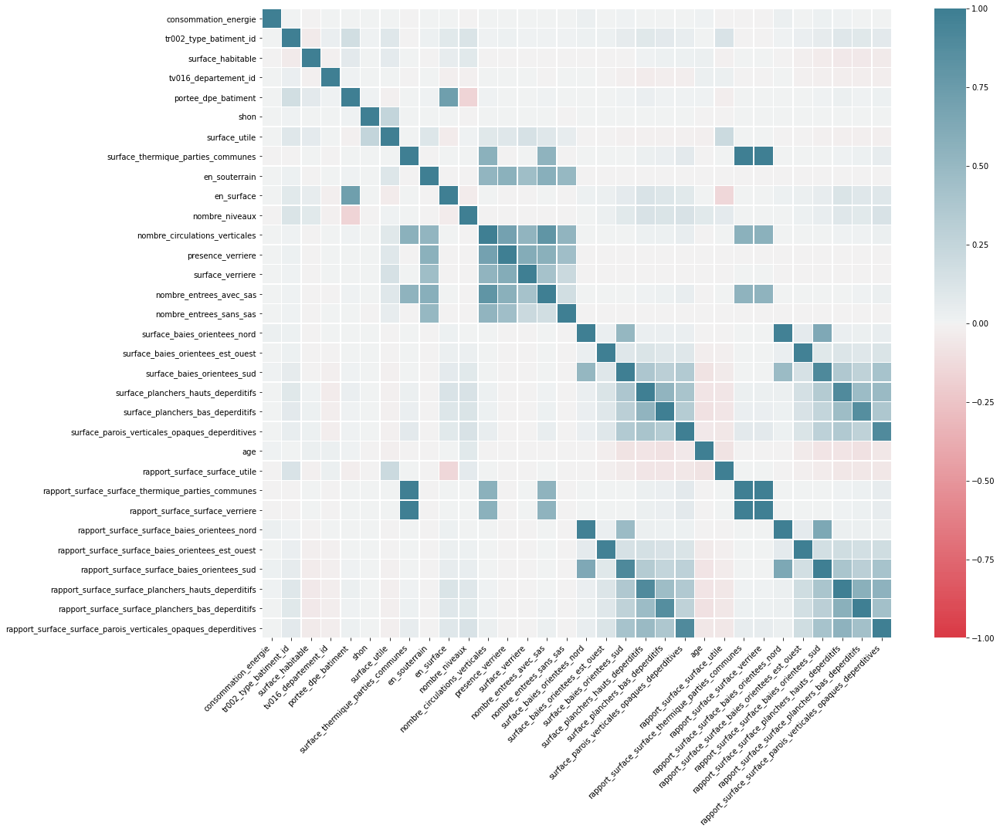

time: 2.05 s (started: 2021-02-23 12:51:53 +00:00)


In [ ]:
corr = df.corr()

plt.subplots(figsize=(20,15))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(10, 220, n=2000),
    square=True, linewidths=.5
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

* The columns we have created are naturally highly correlated to the columns we used to calculate them.


* Normally for tree based models, the only reason to remove highly correlated features is storage and speed concerns. Since for now we don't have that issue we will keep them and see how it goes in training. 

In [ ]:

df.dtypes

consommation_energie                                              float64
classe_consommation_energie                                        object
tr002_type_batiment_id                                              int64
surface_habitable                                                 float64
tv016_departement_id                                                int64
portee_dpe_batiment                                               float64
shon                                                              float64
surface_utile                                                     float64
surface_thermique_parties_communes                                float64
en_souterrain                                                     float64
en_surface                                                        float64
nombre_niveaux                                                    float64
nombre_circulations_verticales                                    float64
presence_verriere                     

time: 5.57 ms (started: 2021-02-23 12:51:55 +00:00)


## Feature Encoding

* The only categorical varibale we have is ***'code_postal'*** (zip code).

* The column is already an int. We could encode it into dummy variables but that woud generate 96 more columns, so for the time being we will keep the current format.

* We tested training with OneHotEncoding generated variables and it turns out that it really slows the training down. TBC.

In [ ]:
# df = pd.concat( [df, pd.get_dummies(df['tv016_departement_id'], prefix = 'depart') ] , axis = 1)
# df = df.drop(['classe_consommation_energie','tv016_departement_id'],axis = 1)

time: 959 µs (started: 2021-02-23 12:51:55 +00:00)


In [ ]:
df.shape

(289963, 33)

time: 5.14 ms (started: 2021-02-23 12:51:55 +00:00)


## Export clean dataframe

In [ ]:
#df.to_csv(r'/content/drive/My Drive/dpe_5_clean_with_classes.csv',index = False)

time: 773 µs (started: 2021-02-23 12:51:55 +00:00)


* Let's drop the class column. We will use it later on for the multi class classification problem 

In [ ]:
df_clean = df.drop(['classe_consommation_energie'],axis = 1)

time: 87.2 ms (started: 2021-02-23 12:51:55 +00:00)


In [ ]:
#df_clean.to_csv(r'/content/drive/My Drive/dpe_5_clean.csv',index = False)

time: 1.38 ms (started: 2021-02-23 12:51:55 +00:00)


# Machine Learning

In [ ]:
df_clean = pd.read_csv('/content/drive/My Drive/datasets/dpe_5_clean.csv', decimal= '.', low_memory = False)

time: 2.08 s (started: 2021-02-23 12:54:42 +00:00)


In [ ]:
df_clean.head(10)

,consommation_energie,tr002_type_batiment_id,surface_habitable,tv016_departement_id,portee_dpe_batiment,shon,surface_utile,surface_thermique_parties_communes,en_souterrain,en_surface,nombre_niveaux,nombre_circulations_verticales,presence_verriere,surface_verriere,nombre_entrees_avec_sas,nombre_entrees_sans_sas,surface_baies_orientees_nord,surface_baies_orientees_est_ouest,surface_baies_orientees_sud,surface_planchers_hauts_deperditifs,surface_planchers_bas_deperditifs,surface_parois_verticales_opaques_deperditives,age,rapport_surface_surface_utile,rapport_surface_surface_thermique_parties_communes,rapport_surface_surface_verriere,rapport_surface_surface_baies_orientees_nord,rapport_surface_surface_baies_orientees_est_ouest,rapport_surface_surface_baies_orientees_sud,rapport_surface_surface_planchers_hauts_deperditifs,rapport_surface_surface_planchers_bas_deperditifs,rapport_surface_surface_parois_verticales_opaques_deperditives
0,200.66,2,22.00,57,1.0,22.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,3.38,22.00,22.00,12.03,25.0,0.0,0.0,0.0,0.000000,0.000000,0.153636,1.000000,1.000000,0.546818
1,434.98,1,72.00,91,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,51.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,303.00,2,47.97,38,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,47.97,41.78,87.19,19.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,1.000000,0.870961,1.817594
3,419.00,2,27.00,75,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,73.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,184.00,1,82.00,27,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,6.15,0.00,6.15,41.00,41.00,150.00,30.0,0.0,0.0,0.0,0.075000,0.000000,0.075000,0.500000,0.500000,1.829268
5,147.93,2,82.00,29,0.0,0.0,82.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,53.0,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,110.00,1,140.00,47,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,11.35,0.80,18.96,140.00,140.00,140.33,14.0,0.0,0.0,0.0,0.081071,0.005714,0.135429,1.000000,1.000000,1.002357
7,321.00,1,164.00,16,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,11.53,0.00,10.50,78.00,78.00,158.00,72.0,0.0,0.0,0.0,0.070305,0.000000,0.064024,0.475610,0.475610,0.963415
8,449.00,2,38.97,71,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.00,11.80,0.00,38.97,38.97,83.11,19.0,0.0,0.0,0.0,0.000000,0.302797,0.000000,1.000000,1.000000,2.132666
9,264.04,1,143.73,9,1.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.00,8.92,3.14,85.00,85.00,135.41,120.0,0.0,0.0,0.0,0.000000,0.062061,0.021847,0.591387,0.591387,0.942114


time: 73.4 ms (started: 2021-02-23 12:55:04 +00:00)


## Scaling and normalization

* Since we intend to use tree based models, there is no need to scale our data.

## Train and test split

In [ ]:
predictors = df_clean.drop('consommation_energie',axis=1)
target = df_clean['consommation_energie']

time: 21.5 ms (started: 2021-02-23 12:55:06 +00:00)


In [ ]:
train_ratio = 0.75
X_train, X_test, y_train, y_test = train_test_split(predictors,target,test_size=1 - train_ratio,
                                                     random_state=42)
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (217472, 31)
Training Labels Shape: (217472,)
Testing Features Shape: (72491, 31)
Testing Labels Shape: (72491,)
time: 108 ms (started: 2021-02-23 12:55:06 +00:00)


## Modeling

### Metrics

* The various metrics we'll use to evaluate the results of the prediction are :

    1. R Square/Adjusted R Square
    2. Mean Square Error(MSE)/Root Mean Square Error(RMSE)
    3. Mean Absolute Error(MAE)


### Baseline

* We'll use central tendency measures to get a baseline for our predictions. 

#### Mean

* First, let's see how good the mean does as a general prediction :

##### Model

In [ ]:
dummy_regr_mean = DummyRegressor(strategy="mean")

time: 1.15 ms (started: 2021-02-23 12:55:11 +00:00)


In [ ]:
dummy_regr_mean.fit(X_train, y_train)

DummyRegressor(constant=None, quantile=None, strategy='mean')

time: 6.1 ms (started: 2021-02-23 12:55:11 +00:00)


In [ ]:
y_pred_mean = dummy_regr_mean.predict(X_test)

time: 2.47 ms (started: 2021-02-23 12:55:11 +00:00)


##### Metrics

In [ ]:
print('R^2 (coefficient of determination) score:', r2_score(y_test, y_pred_mean))
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_mean))
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_mean))
print('Root Mean Squared Error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_mean)))
mape = np.mean(np.abs((y_test - y_pred_mean) / np.abs(y_test)))
print('Mean Absolute Percentage Error (MAPE):', round(mape * 100, 2))
print('Accuracy:', round(100*(1 - mape), 2))

R^2 (coefficient of determination) score: -1.2531616592204031e-05
Mean Absolute Error (MAE): 146.709489740519
Mean Squared Error (MSE): 134206293.06589848
Root Mean Squared Error (RMSE): 11584.743979298742
Mean Absolute Percentage Error (MAPE): 90.51
Accuracy: 9.49
time: 18.2 ms (started: 2021-02-23 12:55:12 +00:00)


#### Median

##### Model

In [ ]:
dummy_regr_median = DummyRegressor(strategy="median")

time: 1.23 ms (started: 2021-02-23 12:55:15 +00:00)


In [ ]:
dummy_regr_median.fit(X_train, y_train)

DummyRegressor(constant=None, quantile=None, strategy='median')

time: 9.06 ms (started: 2021-02-23 12:55:16 +00:00)


In [ ]:
y_pred_median = dummy_regr_median.predict(X_test)

time: 1.75 ms (started: 2021-02-23 12:55:16 +00:00)


##### Metrics

In [ ]:
print('R^2 (coefficient of determination) score:', r2_score(y_test, y_pred_median))
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_median))
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_median))
print('Root Mean Squared Error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_median)))
mape = np.mean(np.abs((y_test - y_pred_median) / np.abs(y_test)))
print('Mean Absolute Percentage Error (MAPE):', round(mape * 100, 2))
print('Accuracy:', round(100*(1 - mape), 2))

R^2 (coefficient of determination) score: -3.4790423186992214e-05
Mean Absolute Error (MAE): 143.59609358403108
Mean Squared Error (MSE): 134209280.30038476
Root Mean Squared Error (RMSE): 11584.87290825345
Mean Absolute Percentage Error (MAPE): 78.37
Accuracy: 21.63
time: 28.4 ms (started: 2021-02-23 12:55:18 +00:00)


### Random Forest

In [ ]:
rf = RandomForestRegressor(n_estimators = 500,
                           n_jobs = -1,
                           oob_score = True,
                           bootstrap = True,
                           random_state = 42)

time: 15.3 ms (started: 2021-02-23 12:55:26 +00:00)


In [ ]:
rf.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=-1, oob_score=True,
                      random_state=42, verbose=0, warm_start=False)

time: 22min 35s (started: 2021-02-23 12:55:33 +00:00)


In [ ]:
y_pred_rf = rf.predict(X_test)

time: 24.2 s (started: 2021-02-23 13:18:08 +00:00)


In [ ]:
print('R^2 (coefficient of determination) score:', r2_score(y_test, y_pred_rf))
print('Mean Absolute Error (MAE):', mean_absolute_error(y_test, y_pred_rf))
print('Mean Squared Error (MSE):', mean_squared_error(y_test, y_pred_rf))
print('Root Mean Squared Error (RMSE):', np.sqrt(mean_squared_error(y_test, y_pred_rf)))
mape = np.mean(np.abs((y_test - y_pred_rf) / np.abs(y_test)))
print('Mean Absolute Percentage Error (MAPE):', round(mape * 100, 2))
print('Accuracy:', round(100*(1 - mape), 2))

R^2 (coefficient of determination) score: -0.001185513086354284
Mean Absolute Error (MAE): 128.26656861771949
Mean Squared Error (MSE): 134363712.5880691
Root Mean Squared Error (RMSE): 11591.536247972877
Mean Absolute Percentage Error (MAPE): 57.94
Accuracy: 42.06
time: 27.5 ms (started: 2021-02-23 13:18:32 +00:00)


In [ ]:
feature_importance = pd.DataFrame({'feature': X_train.columns, 'importance': rf.feature_importances_}).sort_values(by='importance', ascending=False)
feature_importance = feature_importance.reset_index()
feature_importance

,index,feature,importance
0,2,tv016_departement_id,1.569629e-01
1,21,age,1.569174e-01
2,1,surface_habitable,1.143715e-01
3,26,rapport_surface_surface_baies_orientees_est_ouest,1.093119e-01
4,16,surface_baies_orientees_est_ouest,9.330021e-02
5,18,surface_planchers_hauts_deperditifs,7.648597e-02
6,19,surface_planchers_bas_deperditifs,6.211539e-02
7,30,rapport_surface_surface_parois_verticales_opaq...,4.041083e-02
8,29,rapport_surface_surface_planchers_bas_deperditifs,3.589495e-02
9,28,rapport_surface_surface_planchers_hauts_deperd...,3.394595e-02


time: 1.94 s (started: 2021-02-23 13:18:32 +00:00)


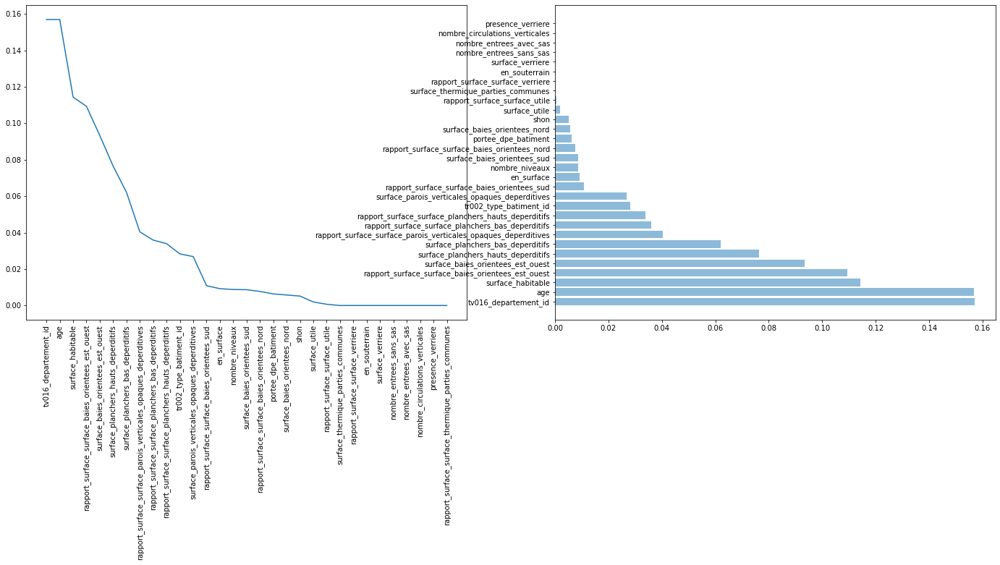

time: 1.18 s (started: 2021-02-23 13:18:34 +00:00)


In [ ]:
def plot_feature_importance(fi):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(24,8))
    ax1.plot(np.arange(0, len(fi.index)), fi['importance'])
    label_nrs = np.arange(0, len(fi.index), 1 )
    ax1.set_xticks(label_nrs)
    ax1.set_xticklabels(fi['feature'][label_nrs], rotation=90)
    
    num_bar = min(len(fi.index), 30)
    ax2.barh(np.arange(0, num_bar), fi['importance'][:num_bar], align='center', alpha=0.5)
    ax2.set_yticks(np.arange(0, num_bar))
    ax2.set_yticklabels(fi['feature'][:num_bar])

plot_feature_importance(feature_importance)

### LightGBM

* **Light GBM** is a gradient boosting framework that uses tree based learning algorithm.


* Light GBM grows tree vertically while other algorithm grows trees horizontally meaning that Light GBM grows tree leaf-wise while other algorithm grows level-wise.


* We chose LightGBM because of its high speed, because it can handle large datasets and it takes lower memory to run. It also focuses on accuracy of results.


* For hyperparameter tuning, we chose a **Bayesian hyperparameter Optimization** approach which builds a probability model of the objective function and uses it to select the most promising hyperparameters to evaluate in the true objective function. Here we use gaussian process-based optimisation.

* Let's start by splitting the train set into a train set and a validation set. We don't use the test set in the hyper-parameter optimization to avoid any leak :

* Let's define the bounds of the dimensions of the search space we want to explore with the hyper-parameter optimization :

* Parameters to be tuned


In [ ]:
df_train = lgb.Dataset(data=X_train, label=y_train)

time: 1.91 ms (started: 2021-02-23 13:18:35 +00:00)


* Objective function : our target here is to optimize MAE.

In [ ]:
def hyp_lgbm(num_leaves, feature_fraction, bagging_fraction, max_depth, min_split_gain, min_child_weight):
      
        # Default parameters
        params = {'application':'regression','num_iterations': 500,
                  'learning_rate':0.05, 'early_stopping_round':50,
                  'metric':'l1'} 

        params["num_leaves"] = int(round(num_leaves))
        params['feature_fraction'] = max(min(feature_fraction, 1), 0)
        params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
        params['max_depth'] = int(round(max_depth))
        params['min_split_gain'] = min_split_gain
        params['min_child_weight'] = min_child_weight

        #Cross validation
        cv_results = lgb.cv(params, df_train, nfold=5, seed=101,categorical_feature=[], stratified=False,
                            verbose_eval =None, metrics=['l1'])
        #print(cv_results)
        return np.max(cv_results['l1-mean'])

time: 12.5 ms (started: 2021-02-23 13:18:35 +00:00)


* Set the range for each parameter

In [ ]:
parameters = {'num_leaves': (80, 200),
          'feature_fraction': (0.1, 0.9),
          'bagging_fraction': (0.8, 1),
          'max_depth': (17, 25),
          'min_split_gain': (0.001, 0.1),
          'min_child_weight': (10, 25)
          }

time: 3.34 ms (started: 2021-02-23 13:18:35 +00:00)


In [ ]:
# Surrogate model
optimizer = BayesianOptimization(hyp_lgbm, parameters, random_state=77)

time: 3.85 ms (started: 2021-02-23 13:18:35 +00:00)


In [ ]:
# Optimize
optimizer.maximize(init_points=10, n_iter=100)

|   iter    |  target   | baggin... | featur... | max_depth | min_ch... | min_sp... | num_le... |
-------------------------------------------------------------------------------------------------
|  1        |  105.2    |  0.9838   |  0.6138   |  23.03    |  12.09    |  0.009645 |  174.6    |
|  2        |  105.2    |  0.8652   |  0.5329   |  18.92    |  18.18    |  0.04065  |  165.8    |
|  3        |  105.2    |  0.9673   |  0.5708   |  19.37    |  14.22    |  0.07085  |  130.7    |
|  4        |  105.2    |  0.8115   |  0.6976   |  20.62    |  12.64    |  0.005888 |  115.1    |
|  5        |  105.2    |  0.8134   |  0.7009   |  17.51    |  16.48    |  0.03705  |  98.24    |
|  6        |  105.2    |  0.9093   |  0.4546   |  17.29    |  22.34    |  0.02806  |  100.3    |
|  7        |  105.5    |  0.9289   |  0.186    |  19.83    |  15.79    |  0.04511  |  197.2    |
|  8        |  105.5    |  0.9459   |  0.3498   |  24.16    |  21.75    |  0.02694  |  117.1    |
|  9        |  105.2

* The best estimator :

In [ ]:
optimizer.max

{'params': {'bagging_fraction': 1.0,
  'feature_fraction': 0.1,
  'max_depth': 25.0,
  'min_child_weight': 25.0,
  'min_split_gain': 0.001,
  'num_leaves': 80.0},
 'target': 264.4514507804576}

time: 7.41 ms (started: 2021-02-23 13:45:03 +00:00)


In [ ]:
params = {'max_depth': 50, #maximum depth of tree
              'num_leaves': 6, #number of leaves in full tree 
              'min_child_samples': 200, 
              'scale_pos_weight': 2.7,
              'subsample': 0.9,
              'colsample_bytree': 0.1,
              'learning_rate':0.97, #impact of each tree on the final outcome
              'metric':'binary_logloss', #loss for binary classification
              'nthread': 8,
              'boosting_type': 'gbdt', #traditional Gradient Boosting Decision Tree
              'objective': 'regression', #for binary classification
              'max_bin': 100,
              'min_child_weight': 0,
              'min_split_gain': 0,
              'subsample_freq': 1,
               }
    

num_boost_round = 1000
    
#Create LightGBM datasets for training and testing
xgtrain = lgbm.Dataset(X_train.values, label=y_train, 
                           categorical_feature = cat_features) #Indicate the categorical feature indices
xgtest = lgbm.Dataset(X_test.values, label=y_test,
                            categorical_feature = cat_features)
    
    
# Fit model on train set 
model_lgb = lgbm.train(params,xgtrain, 
                       num_boost_round=num_boost_round)

NameError: ignored

time: 77.6 ms (started: 2021-02-23 13:45:03 +00:00)


### Catboost

In [ ]:
cat_features = ['tv016_departement_id']

cv_dataset = cgb.Pool(data=X_train,
                  label=y_train,
                  cat_features=cat_features)

In [ ]:
def hyp_cat(depth, bagging_temperature):
    params = {"iterations": 300,
              "learning_rate": 0.05,
              "eval_metric": "R2",
              "verbose": False}
    params[ "depth"] = int(round(depth))
    params["bagging_temperature"] = bagging_temperature

    scores = cgb.cv(cv_dataset,
                params,
                fold_count=3)
    return np.max(scores['test-R2-mean'])

In [ ]:
pds = {'depth': (10, 50),
          'bagging_temperature': (1,10),
          }

In [ ]:
# Surrogate model
optimizer = BayesianOptimization(hyp_cat, pds, random_state=100)
                                  
# Optimize
optimizer.maximize(init_points=3, n_iter=7)

In [ ]:
optimizer.max

# Conclusions & Insights